
We'll cover the following topics:

- A typical problem statement for machine learning
- Downloading and exploring a dataset for machine learning
- Linear regression with one variable using Scikit-learn
- Linear regression with multiple variables 
- Using categorical features for machine learning
- Regression coefficients and feature importance
- Creating a training and test set for reporting results

## About the Boston Housing Dataset

Each record in the database describes a Boston suburb or town. The data was drawn from the Boston Standard Metropolitan Statistical Area (SMSA) in 1970. The attributes are deﬁned as follows (taken from the UCI Machine Learning Repository1): 

- **CRIM**: per capita crime rate by town

- **ZN**: proportion of residential land zoned for lots over 25,000 sq.ft.
- **INDUS**: proportion of non-retail business acres per town
- **CHAS**: Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
- **NOX**: nitric oxides concentration (parts per 10 million)
- **RM**: average number of rooms per dwelling
- **AGE**: proportion of owner-occupied units built prior to 1940
- **DIS**: weighted distances to ﬁve Boston employment centers
- **RAD**: index of accessibility to radial highways
- **TAX**: full-value property-tax rate per \\$10,000
- **PTRATIO**: pupil-teacher ratio by town 
- **B**: 1000(Bk−0.63)2 where Bk is the proportion of blacks by town 
- **LSTAT**: \% lower status of the population
- **MEDV**: Median value of owner-occupied homes in $1000



## Import neccesary libraries

In [1]:
import seaborn as sns
import numpy as np

import pandas as pd
!pip install pandas-profiling --quiet
import pandas_profiling as pp

import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px

%matplotlib inline




You should consider upgrading via the 'C:\Users\Bird Person\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


## Load and explore the data

In [2]:
column_names=["CRIM","ZN","INDUS","CHAS","NOX","RM","AGE","DIS","RAD","TAX","PTRATIO","B","LSTAT","MEDV"]
boston = pd.read_csv("D:\\Romi\\Data_analysis_projects\\housing.csv", names = column_names)
boston.head(2)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.9,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.9,9.14,21.6


In [3]:
boston.shape

(506, 14)

In [4]:
def null_percent(table):
    return round(table.isnull().sum()/table.shape[0]*100,1)

null_percent(boston)

CRIM       0.0
ZN         0.0
INDUS      0.0
CHAS       0.0
NOX        0.0
RM         0.0
AGE        0.0
DIS        0.0
RAD        0.0
TAX        0.0
PTRATIO    0.0
B          0.0
LSTAT      0.0
MEDV       0.0
dtype: float64

In [5]:
boston.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


In [6]:
boston.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [7]:
# Pandas profiling report - a prettier way to visualize the output of the describe method

report = pp.ProfileReport(boston)
display(report)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Visualize all features in  boxplots

We could execute this code for every single feature:

C:\Users\Bird Person\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='CRIM'>

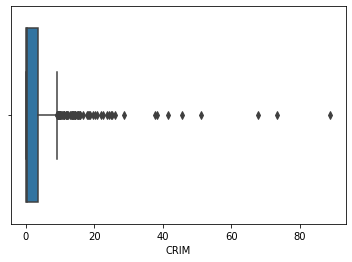

In [8]:
sns.boxplot(boston.CRIM)

But instead we will execute this for loop for all of them

In [9]:
numeric_col = boston.select_dtypes(exclude = ["object"]).columns 
# exclude argument NOT really NECESSARY IN THIS DF
# SINCE THEY'RE ALL NUMERIC. 


numeric_col

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'MEDV'],
      dtype='object')

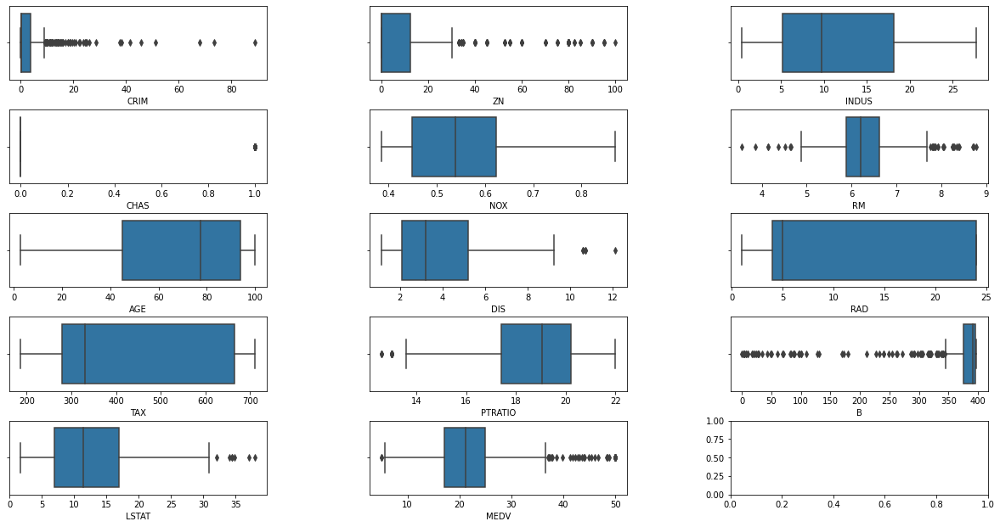

In [10]:

fig, axes = plt.subplots(int(np.ceil(len(numeric_col)/3)), 3, figsize = (20, 10))# f, axs = plt.subplots(2,2,figsize=(15,15))
for i, column in zip(range(len(numeric_col)), numeric_col):
    sns.boxplot(ax = axes[int(np.floor(i/3))][i%3], 
                x = column, data = boston)
    
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

In [11]:
for k, v in boston.items():
    q1 = v.quantile(0.25)
    q3 = v.quantile(0.75)
    irq = q3 - q1
    v_col = v[(v <= q1 - 1.5 * irq)| (v >= q3 + 1.5 * irq)]
    perc = np.shape(v_col)[0]*100 / np.shape(boston)[0]
    print("Column %s outliers = %.2f%%" % (k, perc))

Column CRIM outliers = 13.04%
Column ZN outliers = 13.44%
Column INDUS outliers = 0.00%
Column CHAS outliers = 100.00%
Column NOX outliers = 0.00%
Column RM outliers = 5.93%
Column AGE outliers = 0.00%
Column DIS outliers = 0.99%
Column RAD outliers = 0.00%
Column TAX outliers = 0.00%
Column PTRATIO outliers = 2.96%
Column B outliers = 15.22%
Column LSTAT outliers = 1.38%
Column MEDV outliers = 7.91%


## Linear Regression using a Single Feature

Let's check the correlations between different features

In [12]:
boston.corr()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
CRIM,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621,-0.388305
ZN,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
CHAS,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
NOX,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
RM,-0.219247,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.352734,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
DIS,-0.379670,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
RAD,0.625505,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
TAX,0.582764,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


In [13]:
boston.corr()['MEDV'].sort_values()

LSTAT     -0.737663
PTRATIO   -0.507787
INDUS     -0.483725
TAX       -0.468536
NOX       -0.427321
CRIM      -0.388305
RAD       -0.381626
AGE       -0.376955
CHAS       0.175260
DIS        0.249929
B          0.333461
ZN         0.360445
RM         0.695360
MEDV       1.000000
Name: MEDV, dtype: float64

Let's plot the correlation 

<AxesSubplot:>

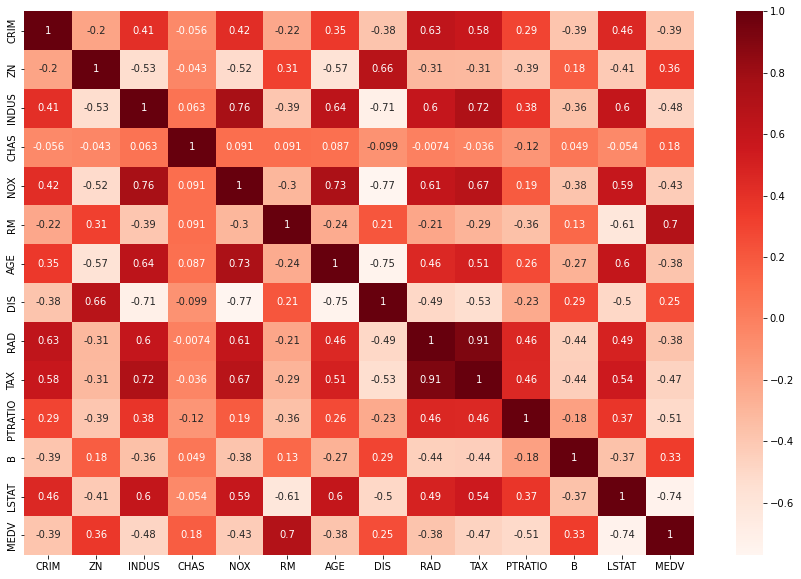

In [14]:
plt.figure(figsize = (15,10))
plt.title("Feature correlation")
sns.heatmap(boston.corr(), cmap='Reds', annot=True)



Since we want to predict de MEDV (Median value of owner-occupied homes in $1000), the MEDV is our dependent variable (y, our "TARGET VALUE")and RM,LSTAT  are the independent variables (x, our "INPUTS")

> From the heatmap we see the highest correlations between  RM and LSTAT with MEDV. Let's plot it


<AxesSubplot:title={'center':'Correlation between RM and MEDV'}, xlabel='RM', ylabel='MEDV'>

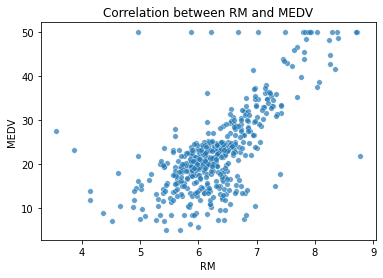

In [15]:
plt.title("Correlation between RM and MEDV")
sns.scatterplot(data = boston, x = "RM", y = "MEDV", s = 30, alpha = 0.7)

<AxesSubplot:title={'center':'Correlation between LSTAT and MEDV'}, xlabel='LSTAT', ylabel='MEDV'>

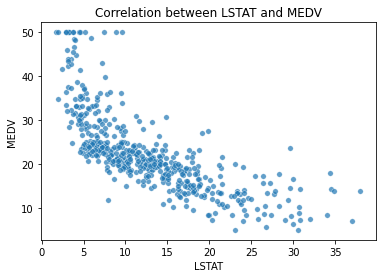

In [16]:
plt.title("Correlation between LSTAT and MEDV")
sns.scatterplot(data = boston, x = "LSTAT", y = "MEDV", s = 30, alpha = 0.7)

**1. Select the type of model**

In order to create our first model, we need to select the type of model we'll use

Since we're dealing with continuos data and not categorized data (i.e. "will it rain or not", "will this passenger will be a no-show"), we can use a LINEAR REGRESSION MODEL


Let's use the feature "RM" to make our first predictions

**2. Prepare the data**

In [17]:
inputs_rm = boston[["RM"]] # ALWAYS REMEMBER THAT INPUTS HAVE TO BE 2-DIMENSIONAL
targets_rm = boston["MEDV"]
print('inputs.shape:', inputs_rm.shape)
print('targets.shape:', targets_rm.shape)

inputs.shape: (506, 1)
targets.shape: (506,)


Note: in case we are dealing with a series in the X value, we have to 
reshape it in order to fit the 2-D criteria. Use this line of code:

`X = X.reshape(-1,1)`

and Bob's your uncle!

**3. Train / test split**

In [18]:
from sklearn.model_selection import train_test_split

inputs ==> X

targets ==> y

In [19]:
inputs_train, inputs_test, targets_train, targets_test  = train_test_split(inputs_rm, targets_rm, test_size=0.3, random_state=42)
print(inputs_train.shape)
print(inputs_test.shape)
print(targets_train.shape)
print(targets_test.shape)

(354, 1)
(152, 1)
(354,)
(152,)


**4. Fit data to model**

In [20]:
from sklearn.linear_model import LinearRegression

model_rm = LinearRegression(fit_intercept = True) # try argument: fit_intercept=True to check for differences
#(the y-intercept will be determined by the line of best fit. )
model_rm.fit(inputs_train, targets_train)
# Create and train the model at the same time is another option
# model = LinearRegression().fit(inputs_train, targets_train)

LinearRegression()

In [21]:
print(model_rm.coef_)
print(model_rm.intercept_)
print(model_rm.rank_)

[9.1181022]
-34.662307438406785
1


**5. Generate predictions using the the train and the test data and compare metrics. Compute LOSS of model**

In [22]:
# Generate predictions on training set

pred_train = model_rm.predict(inputs_train)


# Create a function to evaluate rmse
def rmse(targets, predictions):
    return np.sqrt(np.mean(np.square(targets - predictions)))

train_rmse = rmse(targets_train, pred_train)
print('The RMSE loss for the training set is $ {:.2f}'.format(train_rmse))

The RMSE loss for the training set is $ 6.71


In [23]:
# Generate predictions on test set

pred_test = model_rm.predict(inputs_test)

test_rmse = rmse(targets_test, pred_test)
# Compute loss to evalute the model
#loss = rmse(targets_test, pred_test)
#print('Test Loss:', loss)
print('The RMSE loss for the test set is $ {:.2f}'.format(test_rmse))

The RMSE loss for the test set is $ 6.35


In [24]:
from sklearn.metrics import r2_score
print(model_rm.score(inputs_test,targets_test))

0.4584649934303068


**6. Visualize predictions**

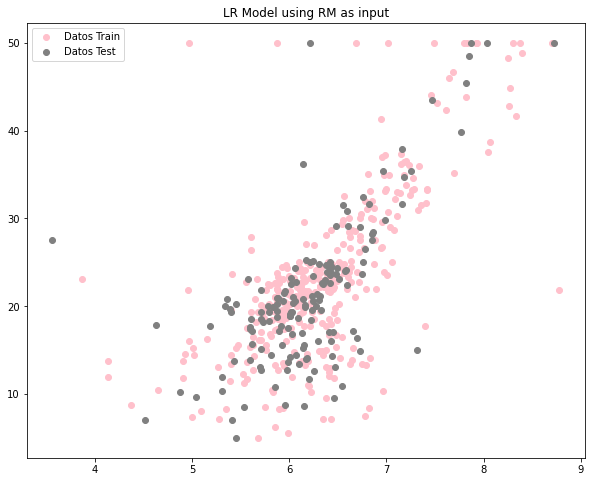

In [25]:
plt.figure(figsize = (10,8))
plt.title("LR Model using RM as input")
#inputs_train, inputs_test, targets_train, targets_test 
plt.scatter(inputs_train, targets_train,  color='pink', label = 'Datos Train')
# plt.plot(X_train, y_train_pred, color='k', linestyle = '--', label = 'Prediccion Train')

plt.scatter(inputs_test, targets_test,  color='grey', label = 'Datos Test')
# plt.plot(X_test, y_test_pred, color='blue', linewidth=5.0, label = 'Prediccion Test')

plt.legend()
plt.show()

In [26]:
model_rm.coef_, model_rm.intercept_

(array([9.1181022]), -34.662307438406785)

In [27]:
def estimate_medv(rooms, w, b):  # w also called weight, and b is also called bias in ML
    return w * rooms + b

In [28]:
estimate_medv(7, model_rm.coef_, model_rm.intercept_)

array([29.16440794])

In [29]:
estimated_medv = estimate_medv(inputs_rm,model_rm.coef_, model_rm.intercept_) # with rooms series we use the coef and intercept predict by model
estimated_medv

,RM
0,25.289215
1,23.885027
2,30.851257
3,29.146172
4,30.504769
...,...
501,25.453340
502,21.140478
503,28.945573
504,27.286079


Text(0, 0.5, 'Estimated Charges')

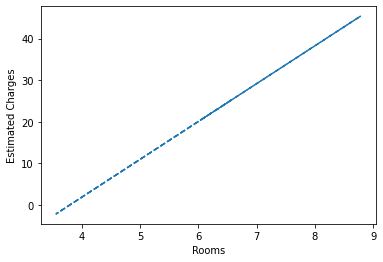

In [30]:
plt.plot(inputs_rm, estimated_medv, "--")
plt.xlabel("Rooms")
plt.ylabel("Estimated Charges")

Let's compare the actual MEDV vs estimated MEDV

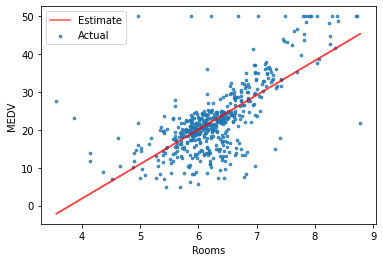

In [31]:
inputs_rm = boston[["RM"]]
targets_rm = boston["MEDV"]
plt.plot(inputs_rm, estimated_medv, "r", alpha = 0.7)
plt.scatter(inputs_rm, targets_rm, s = 7, alpha = 0.8)
plt.xlabel("Rooms")
plt.ylabel("MEDV")
plt.legend(["Estimate", "Actual"])


> **Model with LSTAT feature**

In [32]:
inputs_LSTAT= boston[["LSTAT"]] 
targets_LSTAT = boston["MEDV"]
print('inputs.shape:', inputs_LSTAT.shape)
print('targets.shape:', targets_LSTAT.shape)

inputs.shape: (506, 1)
targets.shape: (506,)


In [33]:
inputs_train, inputs_test, targets_train, targets_test  = train_test_split(inputs_LSTAT, targets_LSTAT, test_size=0.3, random_state=42)

print(inputs_train.shape)
print(inputs_test.shape)
print(targets_train.shape)
print(targets_test.shape)

(354, 1)
(152, 1)
(354,)
(152,)


In [34]:
model_LSTAT = LinearRegression(fit_intercept = True)
model_LSTAT.fit(inputs_train, targets_train)

LinearRegression()

In [35]:
print(model_LSTAT.coef_)
print(model_LSTAT.intercept_)
print(model_LSTAT.rank_)

[-0.98620321]
35.26557743777448
1


In [36]:
from sklearn.metrics import mean_squared_error


pred_train = model_rm.predict(inputs_train)
pred_test = model_rm.predict(inputs_test)


print('Error en datos de train:', mean_squared_error(targets_train, pred_train))
print('Error en datos de test:', mean_squared_error(targets_test, pred_test))

Error en datos de train: 8277.977453276599
Error en datos de test: 9290.147645689687


C:\Users\Bird Person\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- LSTAT
Feature names seen at fit time, yet now missing:
- RM

  warnings.warn(message, FutureWarning)
C:\Users\Bird Person\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- LSTAT
Feature names seen at fit time, yet now missing:
- RM

  warnings.warn(message, FutureWarning)


In [37]:
from sklearn.metrics import r2_score
print(model_LSTAT.score(inputs_test,targets_test))

0.4886979007906853


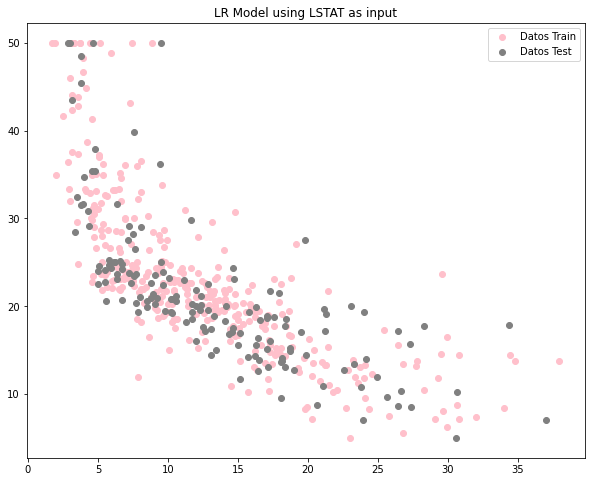

In [38]:
plt.figure(figsize = (10,8))
plt.title("LR Model using LSTAT as input")

plt.scatter(inputs_train, targets_train,  color='pink', label = 'Datos Train')

plt.scatter(inputs_test, targets_test,  color='grey', label = 'Datos Test')

plt.legend()
plt.show()


In [39]:
model_LSTAT.coef_, model_LSTAT.intercept_

(array([-0.98620321]), 35.26557743777448)

In [40]:
def estimate_medv_lstat(lstat, w, b):
    return w * lstat + b

In [41]:
boston.LSTAT.describe()

count    506.000000
mean      12.653063
std        7.141062
min        1.730000
25%        6.950000
50%       11.360000
75%       16.955000
max       37.970000
Name: LSTAT, dtype: float64

In [42]:
estimate_medv_lstat(11, model_LSTAT.coef_, model_LSTAT.intercept_)

array([24.41734212])

In [43]:
estimated_medv_lstat = estimate_medv(inputs_LSTAT, model_LSTAT.coef_, model_LSTAT.intercept_) # with rooms series we use the coef and intercept predict by model
estimated_medv_lstat

,LSTAT
0,30.354285
1,26.251680
2,31.291178
3,32.366140
4,30.009114
...,...
501,25.728992
502,26.310852
503,29.703391
504,28.874981


Text(0, 0.5, 'Estimated Charges')

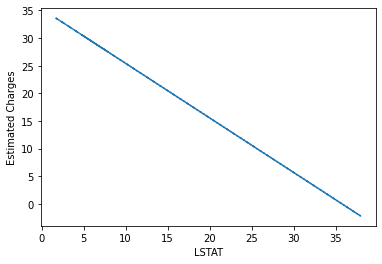

In [44]:
plt.plot(inputs_LSTAT, estimated_medv_lstat, "--")
plt.xlabel("LSTAT")
plt.ylabel("Estimated Charges")

Let's compare the actual MEDV vs estimated MEDV

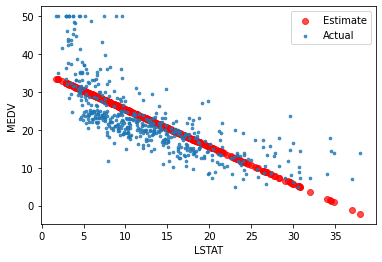

In [45]:
inputs_LSTAT = boston[["LSTAT"]]
targets_LSTAT = boston["MEDV"]
plt.scatter(inputs_LSTAT, estimated_medv_lstat, color = "red", alpha = 0.7)
plt.scatter(inputs_LSTAT, targets_LSTAT, s = 7,alpha = 0.8)
plt.xlabel("LSTAT")
plt.ylabel("MEDV")
plt.legend(["Estimate", "Actual"])


> **Model with PTRATIO feature**

In [46]:
inputs_PTRATIO= boston[["PTRATIO"]] 
targets_PTRATIO = boston["MEDV"]
print('inputs.shape:', inputs_PTRATIO.shape)
print('targets.shape:', targets_PTRATIO.shape)

inputs.shape: (506, 1)
targets.shape: (506,)


In [47]:
X_train, X_test, y_train, y_test = train_test_split(inputs_PTRATIO, targets_PTRATIO, test_size=0.3, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(354, 1)
(152, 1)
(354,)
(152,)


In [48]:
model_PTRATIO = LinearRegression(fit_intercept = True)
model_PTRATIO.fit(X_train, y_train)

LinearRegression()

In [49]:
print(model_PTRATIO.coef_)
print(model_PTRATIO.intercept_)
print(model_PTRATIO.rank_)

[-2.04718941]
60.43427787323503
1


In [50]:
y_train_pred = model_PTRATIO.predict(X_train)
y_test_pred = model_PTRATIO.predict(X_test)
print('Error en datos de train:', mean_squared_error(y_train, y_train_pred))
print('Error en datos de test:', mean_squared_error(y_test, y_test_pred))

Error en datos de train: 66.61167782053649
Error en datos de test: 53.666693366394775


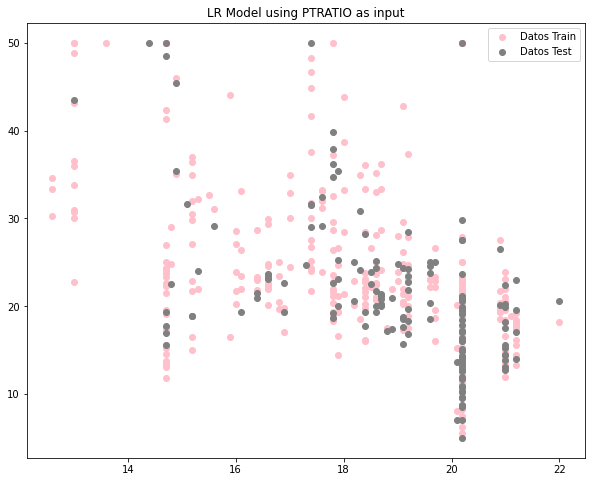

In [51]:
plt.figure(figsize = (10,8))
plt.title("LR Model using PTRATIO as input")

plt.scatter(X_train, y_train,  color='pink', label = 'Datos Train')

plt.scatter(X_test, y_test,  color='grey', label = 'Datos Test')

plt.legend()
plt.show()

C:\Users\Bird Person\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='PTRATIO'>

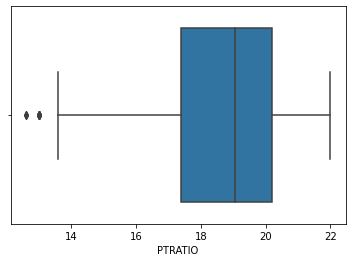

In [52]:
sns.boxplot(boston.PTRATIO)

In [53]:
model_PTRATIO.coef_, model_PTRATIO.intercept_

(array([-2.04718941]), 60.43427787323503)

In [54]:
def estimate_medv_ptratio(ptratio, w, b):  # w also called weight, and b is also called bias in ML
    return w * ptratio + b

In [55]:
boston.PTRATIO.describe()

count    506.000000
mean      18.455534
std        2.164946
min       12.600000
25%       17.400000
50%       19.050000
75%       20.200000
max       22.000000
Name: PTRATIO, dtype: float64

In [56]:
estimate_medv_ptratio(19, model_PTRATIO.coef_, model_PTRATIO.intercept_)

array([21.53767906])

In [57]:
estimated_medv_ptratio = estimate_medv_ptratio(inputs_PTRATIO, model_PTRATIO.coef_, model_PTRATIO.intercept_)

Text(0, 0.5, 'Estimated Charges')

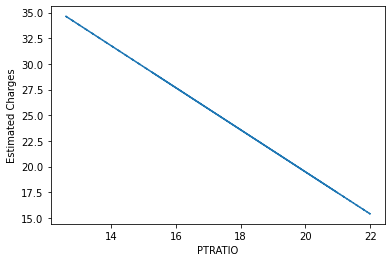

In [58]:
plt.plot(inputs_PTRATIO, estimated_medv_ptratio, "--")
plt.xlabel("PTRATIO")
plt.ylabel("Estimated Charges")

Let's compare the actual MEDV vs estimated MEDV

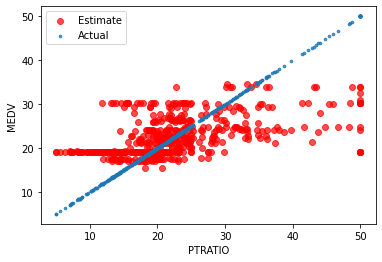

In [59]:
inputs_PTRATIO = boston[["PTRATIO"]]
inputs_PTRATIO = boston["MEDV"]
plt.scatter(inputs_PTRATIO, estimated_medv_ptratio, color = "red", alpha = 0.7)
plt.scatter(inputs_PTRATIO, targets_LSTAT, s = 7,alpha = 0.8)
plt.xlabel("PTRATIO")
plt.ylabel("MEDV")
plt.legend(["Estimate", "Actual"])


---

I'll come back later to check on this last feature